# Zalo Traffic Sign Dataset - Exploratory Data Analysis (EDA)

This notebook provides a comprehensive analysis of the Zalo Traffic Sign Detection dataset. The goal is to investigate data quality issues (small objects, duplicates) and class distribution to justify the preprocessing pipeline implemented in `preprocess_clean_augment.py`.

In [1]:
import json
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
import pandas as pd
from collections import Counter
from pathlib import Path

# Setup paths (Using absolute paths based on workspace)
BASE_DIR = "/Users/duongthanhduy/traffic-sign-detection-zalo-2020"
DATASET_DIR = os.path.join(BASE_DIR, "zalo_dataset/traffic_train/traffic_train")
IMG_DIR = os.path.join(DATASET_DIR, "images")
JSON_PATH = os.path.join(DATASET_DIR, "train_traffic_sign_dataset.json")

print(f"Annotation file: {JSON_PATH}")
print(f"Image directory: {IMG_DIR}")

Annotation file: /Users/duongthanhduy/traffic-sign-detection-zalo-2020/zalo_dataset/traffic_train/traffic_train/train_traffic_sign_dataset.json
Image directory: /Users/duongthanhduy/traffic-sign-detection-zalo-2020/zalo_dataset/traffic_train/traffic_train/images


## 1. Load Dataset & Basic Statistics

In [2]:
# Load COCO annotations
with open(JSON_PATH, 'r') as f:
    coco_data = json.load(f)

images = {img['id']: img for img in coco_data['images']}
annotations = coco_data['annotations']
categories = {cat['id']: cat for cat in coco_data['categories']}

print(f"Total Images: {len(images)}")
print(f"Total Annotations: {len(annotations)}")
print(f"Total Categories: {len(categories)}")

# Create category map
cat_id_to_name = {cat['id']: cat['name'] for cat in coco_data['categories']}
print("\nCategories:", list(cat_id_to_name.values()))

Total Images: 4500
Total Annotations: 11000
Total Categories: 7

Categories: ['Cấm ngược chiều', 'Cấm dừng và đỗ', 'Cấm rẽ', 'Giới hạn tốc độ', 'Cấm còn lại', 'Nguy hiểm', 'Hiệu lệnh']


## 2. Visualization Helper Functions

In [3]:
def show_image_with_boxes(img_id, anns, title=None, highlight_anns=None):
    """Helper to display image with bounding boxes using Matplotlib for proper font support"""
    img_info = images[img_id]
    img_path = os.path.join(IMG_DIR, img_info['file_name'])

    # Read image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error: Could not read {img_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create figure and axes
    fig, ax = plt.subplots(figsize=(12, 8))

    # Display the image
    ax.imshow(img)

    # Draw boxes
    for ann in anns:
        x, y, w, h = map(int, ann['bbox'])
        cat_id = ann['category_id']
        label = cat_id_to_name[cat_id]

        # Determine color
        is_highlighted = highlight_anns and ann in highlight_anns
        edge_color = 'yellow' if is_highlighted else 'red'
        line_width = 3 if is_highlighted else 2

        # Create a Rectangle patch
        rect = patches.Rectangle((x, y), w, h, linewidth=line_width, edgecolor=edge_color, facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

        # Add label with background for visibility
        # Using Matplotlib text enables proper Unicode support (Vietnamese)
        # Check if label is Vietnamese and might need font support, currently default font usually supports standard VN chars in Matplotlib
        ax.text(x, y - 5, label, color='black' if is_highlighted else 'white', fontsize=10, backgroundcolor=edge_color,
                bbox=dict(facecolor=edge_color, alpha=0.5, edgecolor='none', pad=1))

    if title:
        ax.set_title(title)
    else:
        ax.set_title(f"Image ID: {img_id}")
    ax.axis('off')
    plt.show()

Visualizing 3 samples per class:

--- Class: Cấm ngược chiều (ID: 1) ---
Sample 1/3: Image 40


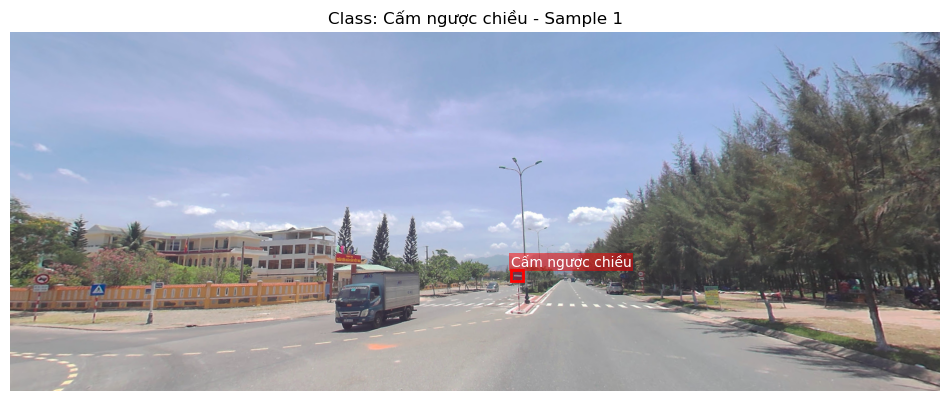

Sample 2/3: Image 50


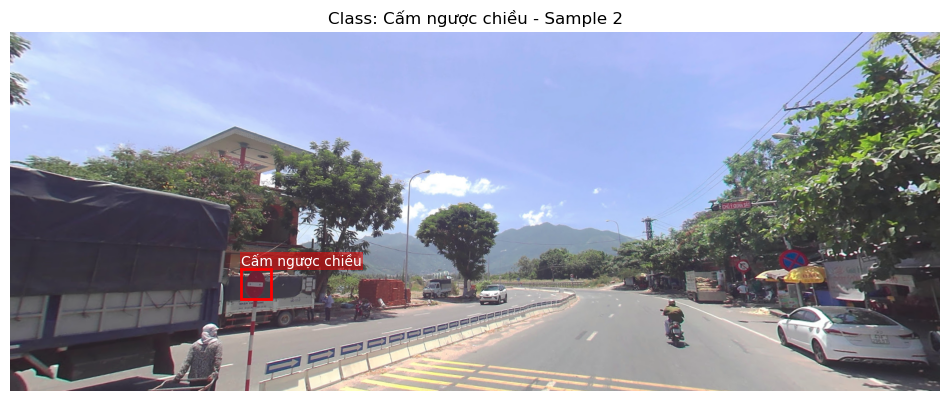

Sample 3/3: Image 86


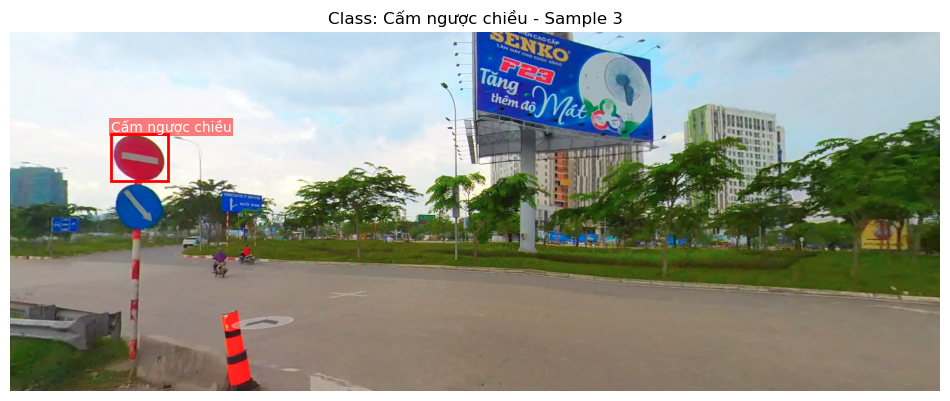


--- Class: Cấm dừng và đỗ (ID: 2) ---
Sample 1/3: Image 3


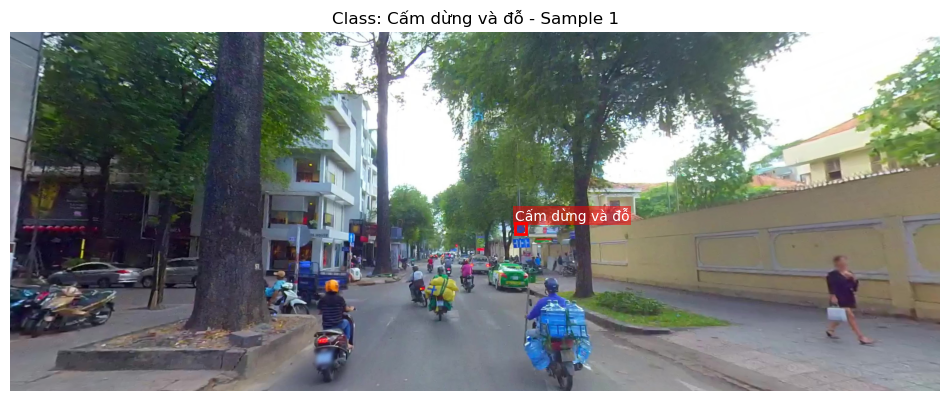

Sample 2/3: Image 5


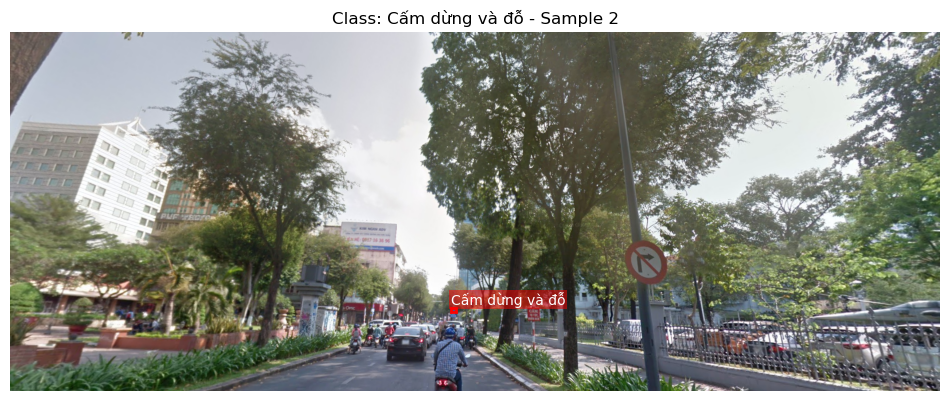

Sample 3/3: Image 16


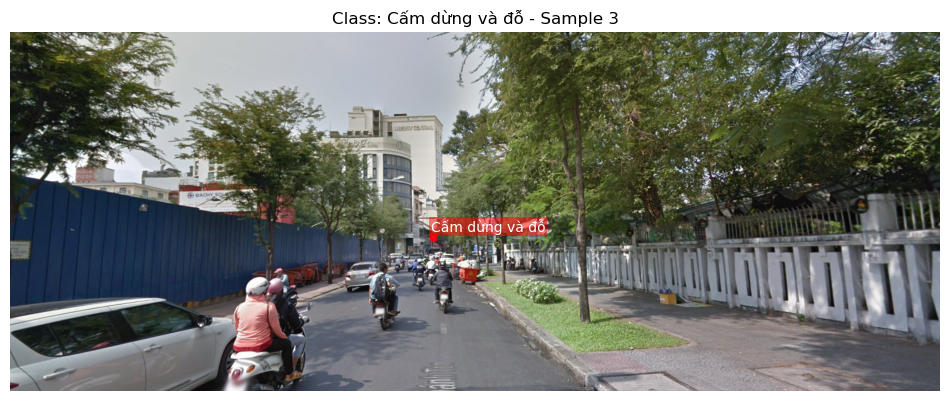


--- Class: Cấm rẽ (ID: 3) ---
Sample 1/3: Image 5


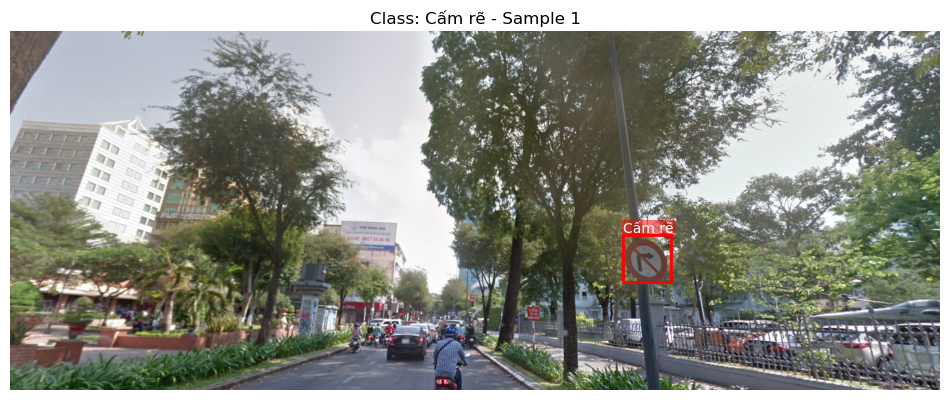

Sample 2/3: Image 18


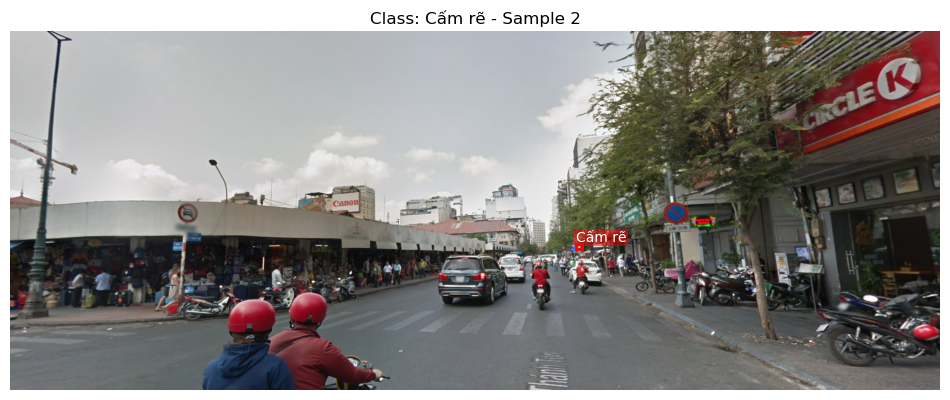

Sample 3/3: Image 21


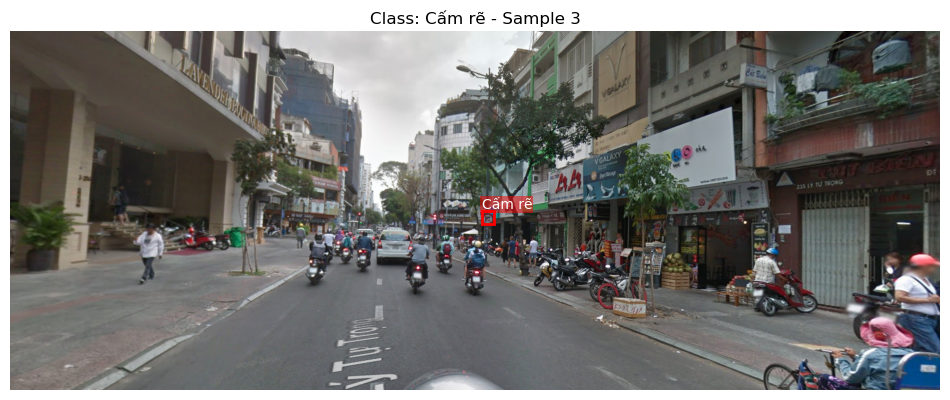


--- Class: Giới hạn tốc độ (ID: 4) ---
Sample 1/3: Image 33


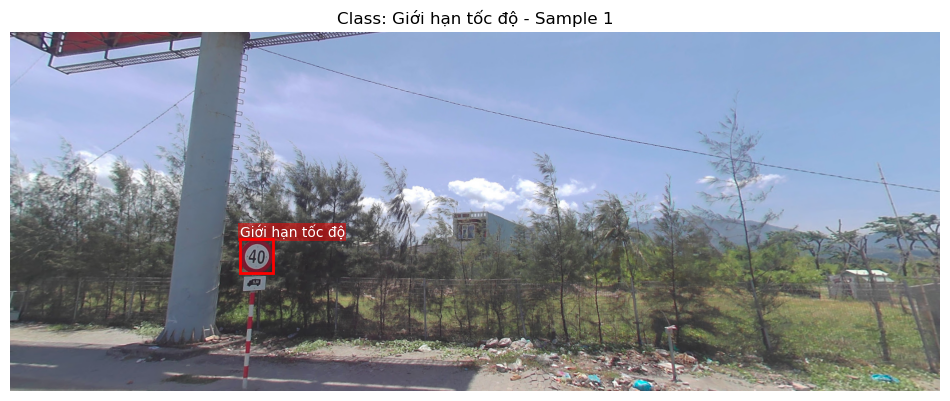

Sample 2/3: Image 40


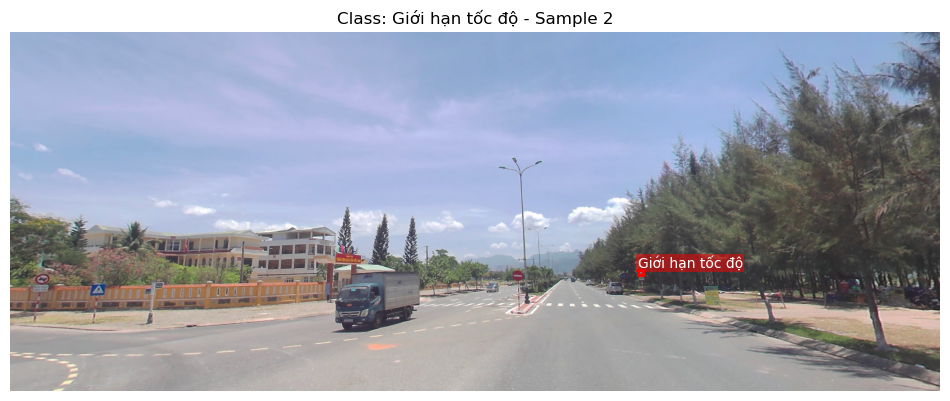

Sample 3/3: Image 59


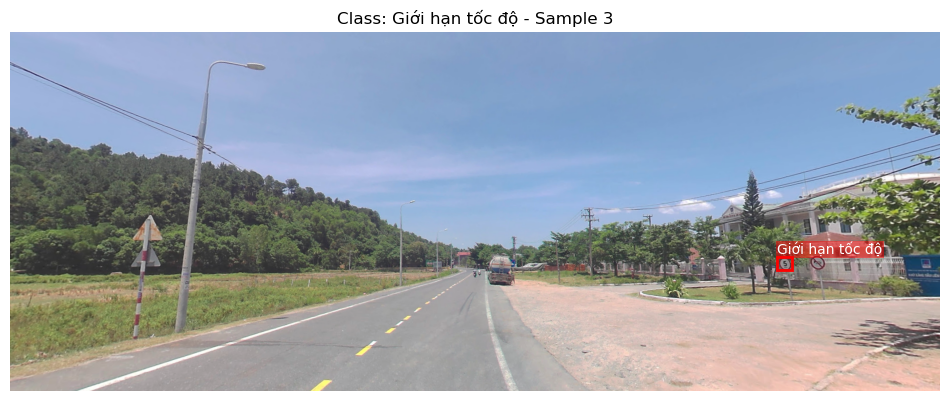


--- Class: Cấm còn lại (ID: 5) ---
Sample 1/3: Image 18


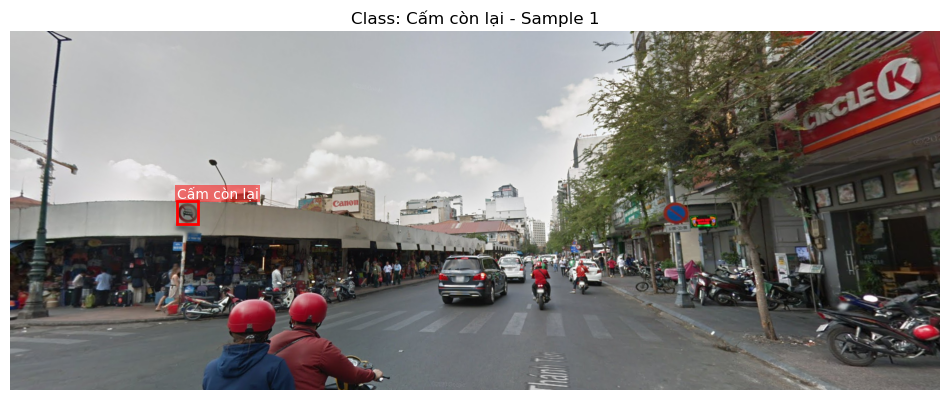

Sample 2/3: Image 25


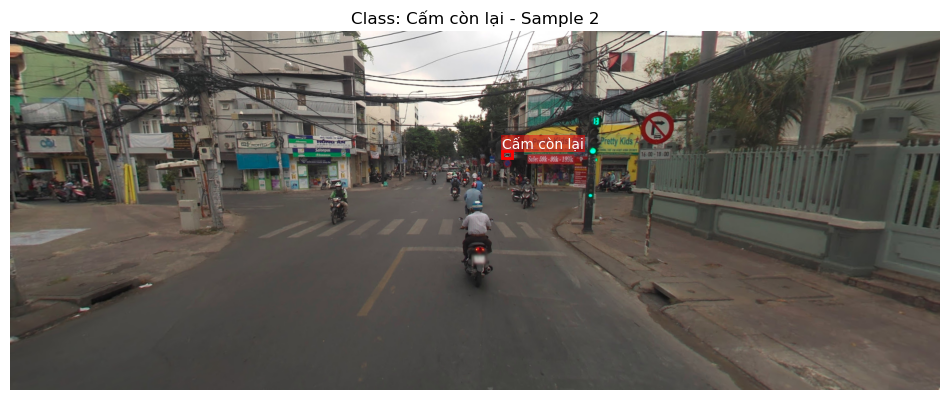

Sample 3/3: Image 35


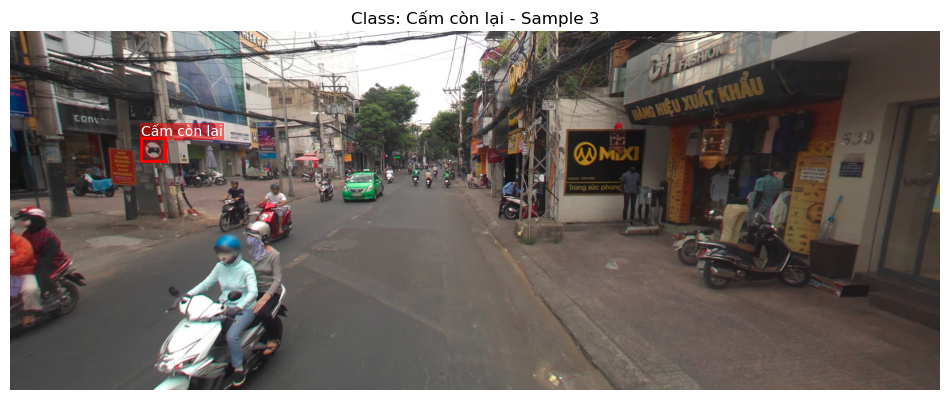


--- Class: Nguy hiểm (ID: 6) ---
Sample 1/3: Image 6


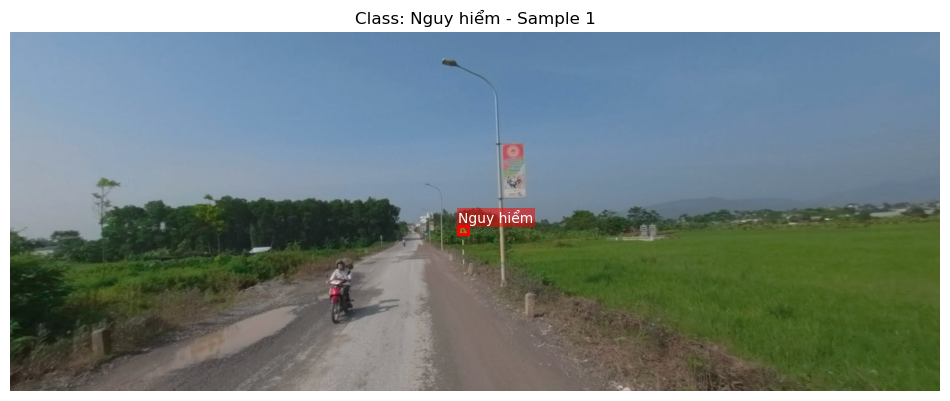

Sample 2/3: Image 32


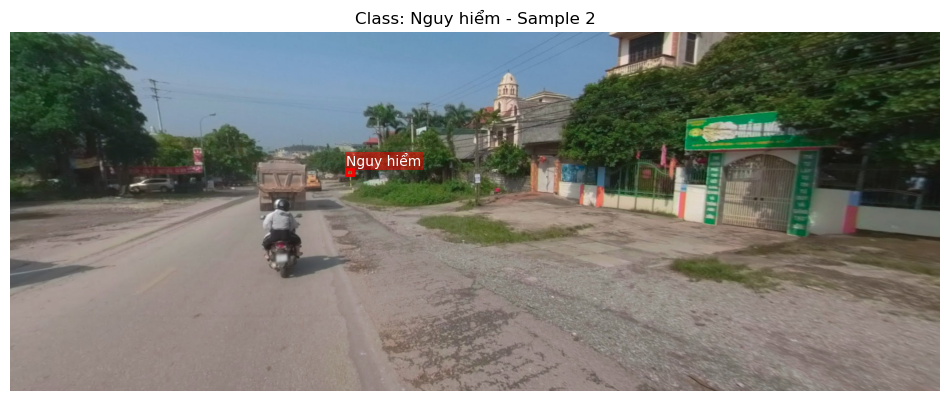

Sample 3/3: Image 63


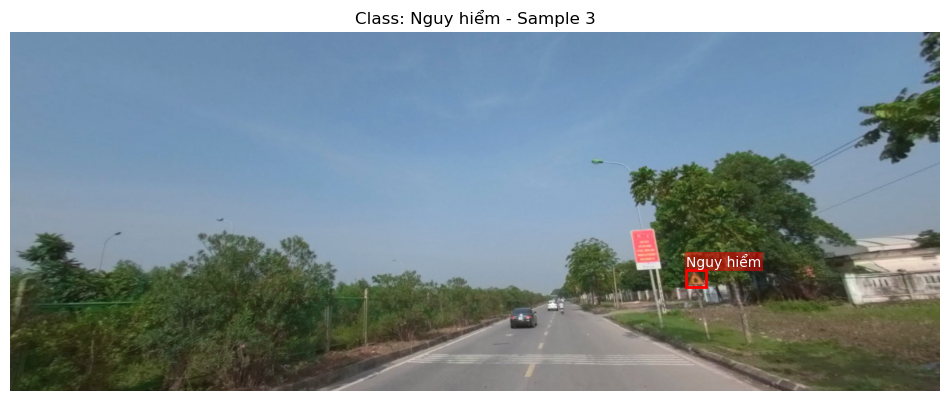


--- Class: Hiệu lệnh (ID: 7) ---
Sample 1/3: Image 79


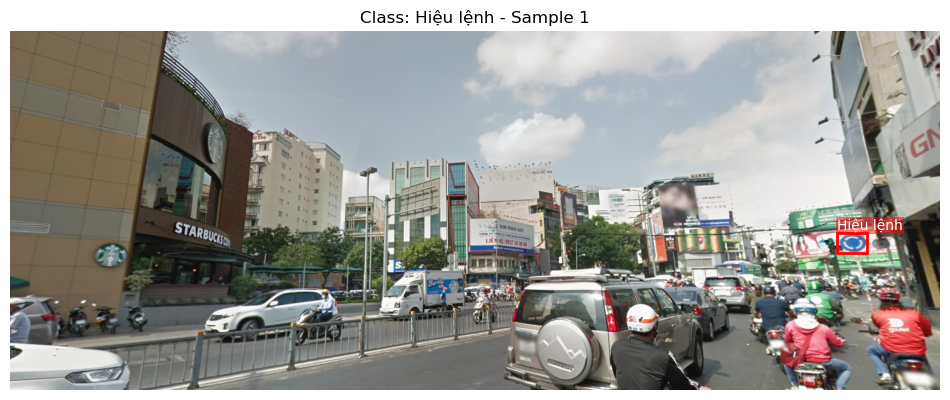

Sample 2/3: Image 86


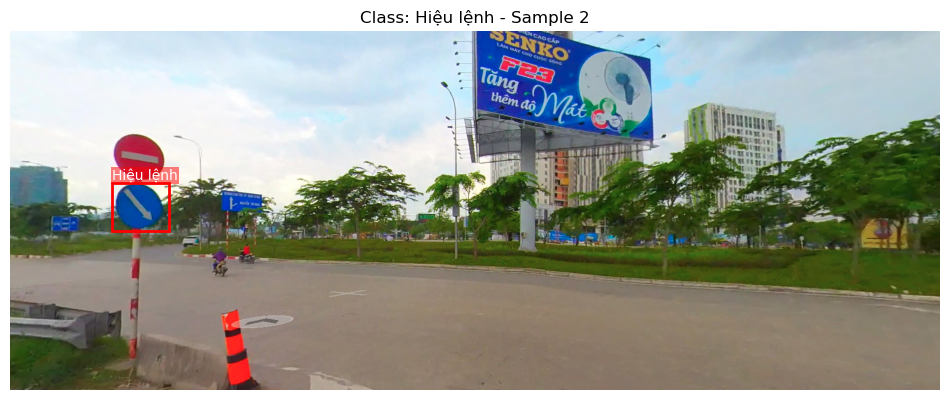

Sample 3/3: Image 138


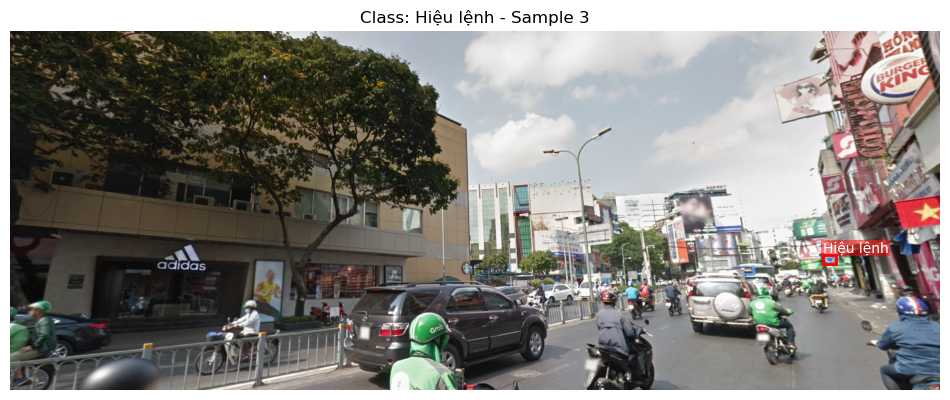

In [4]:
print("Visualizing 3 samples per class:")
for cat_id, cat_name in cat_id_to_name.items():
    print(f"\n--- Class: {cat_name} (ID: {cat_id}) ---")
    # Find annotations for this class
    class_anns = [ann for ann in annotations if ann['category_id'] == cat_id]

    # Take up to 3 samples
    samples = class_anns[:3]
    for i, ann in enumerate(samples):
        img_id = ann['image_id']
        print(f"Sample {i+1}/{len(samples)}: Image {img_id}")
        # Use helper to show just this box on the image
        show_image_with_boxes(img_id, [ann], title=f"Class: {cat_name} - Sample {i+1}")

## 3. Analysis: Small Bounding Boxes
Small boxes (e.g., area < 40 pixels) often represent noise or extremely far objects that are hard to detect and train on.

Statistics for Bounding Box Areas:
  Min Area: 4
  Max Area: 54526
  Median Area: 266.0
  Boxes < 40px area: 769 (6.99%)


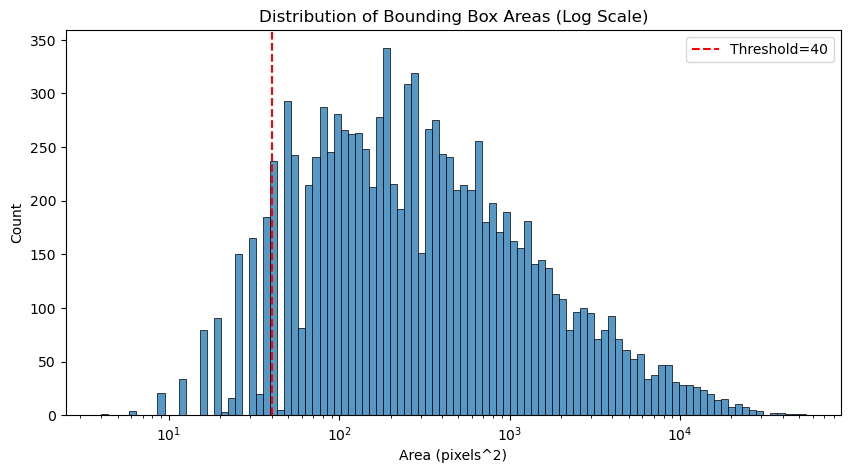

In [5]:
# Calculate areas
areas = []
small_anns = []
SMALL_THRESHOLD = 40

for ann in annotations:
    w, h = ann['bbox'][2], ann['bbox'][3]
    area = w * h
    areas.append(area)
    if area < SMALL_THRESHOLD:
        small_anns.append(ann)

print(f"Statistics for Bounding Box Areas:")
print(f"  Min Area: {min(areas)}")
print(f"  Max Area: {max(areas)}")
print(f"  Median Area: {np.median(areas)}")
print(f"  Boxes < {SMALL_THRESHOLD}px area: {len(small_anns)} ({len(small_anns)/len(annotations)*100:.2f}%)")

# Plot distribution
plt.figure(figsize=(10, 5))
sns.histplot(areas, bins=100, log_scale=True)
plt.axvline(x=SMALL_THRESHOLD, color='r', linestyle='--', label=f'Threshold={SMALL_THRESHOLD}')
plt.title("Distribution of Bounding Box Areas (Log Scale)")
plt.xlabel("Area (pixels^2)")
plt.legend()
plt.show()

Found 438 images with small boxes. Showing 5 samples...
Visualizing Image 8194 - Contains 1 small boxes (marked yellow)


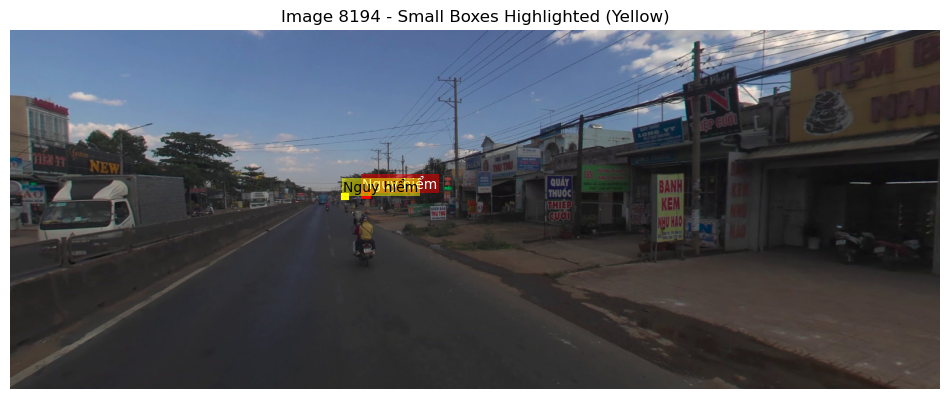

Visualizing Image 4099 - Contains 1 small boxes (marked yellow)


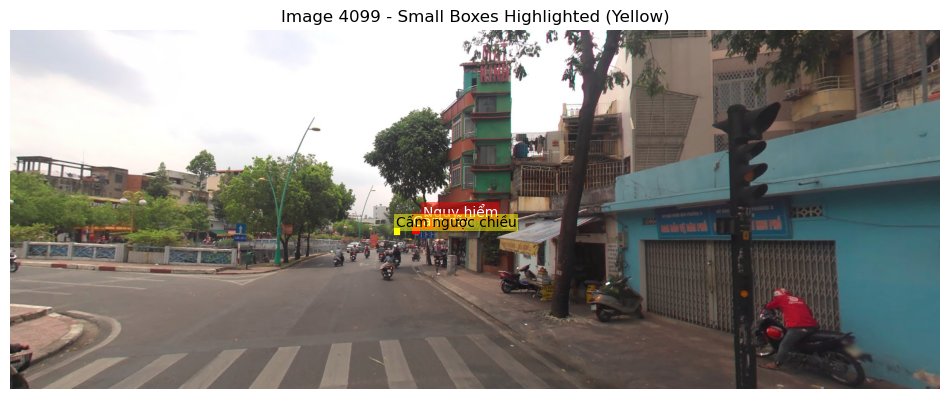

Visualizing Image 4100 - Contains 7 small boxes (marked yellow)


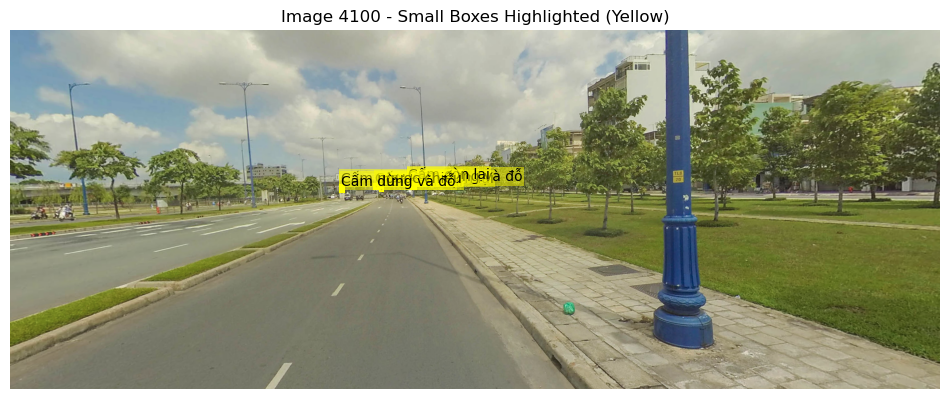

Visualizing Image 8195 - Contains 1 small boxes (marked yellow)


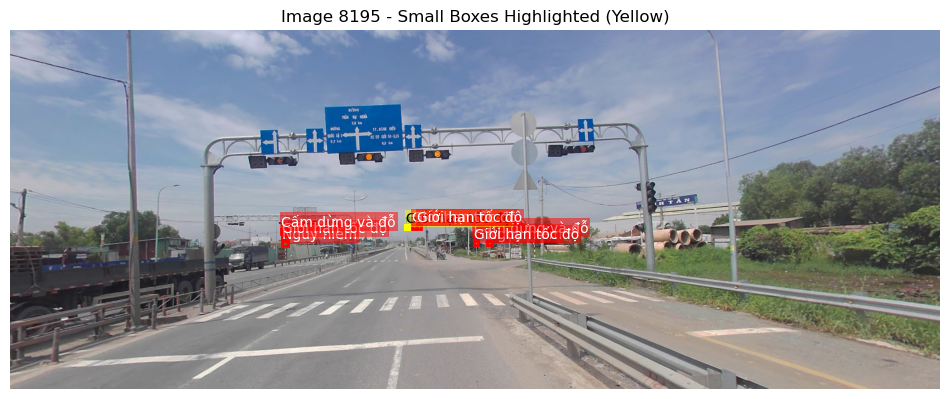

Visualizing Image 10245 - Contains 3 small boxes (marked yellow)


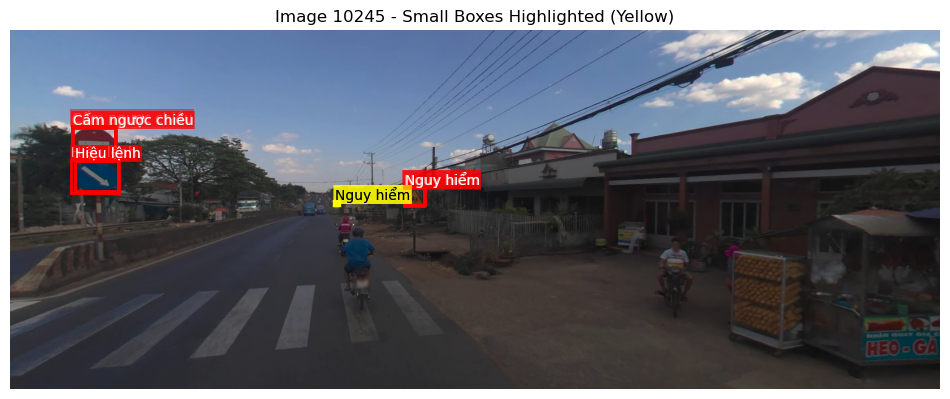

In [6]:
# Visualize samples with small boxes (Show 5 images)
if small_anns:
    # Find unique images with small boxes
    small_img_ids = list(set([ann['image_id'] for ann in small_anns]))

    # Select up to 5 images
    selected_img_ids = small_img_ids[:5]
    print(f"Found {len(small_img_ids)} images with small boxes. Showing {len(selected_img_ids)} samples...")

    for img_id in selected_img_ids:
        # Get all annotations for this image
        anns_in_img = [a for a in annotations if a['image_id'] == img_id]

        # Identify the small ones in this image for highlighting
        small_in_this_img = [a for a in anns_in_img if a['bbox'][2]*a['bbox'][3] < SMALL_THRESHOLD]

        print(f"Visualizing Image {img_id} - Contains {len(small_in_this_img)} small boxes (marked yellow)")
        show_image_with_boxes(img_id, anns_in_img,
                            title=f"Image {img_id} - Small Boxes Highlighted (Yellow)",
                            highlight_anns=small_in_this_img)
else:
    print("No small boxes found.")

**Conclusion:** 
Boxes smaller than 40px are extremely small and likely noise. Removing them cleans the dataset for better training stability.

## 4. Analysis: Overlapping / Duplicate Boxes
Sometimes datasets contain duplicate annotations for the same object. We check for high Intersection over Union (IoU) > 0.7 for boxes of the same class.

In [7]:
def calculate_iou(box1, box2):
    # box: [x, y, w, h]
    x1_min, y1_min, w1, h1 = box1
    x2_min, y2_min, w2, h2 = box2

    x1_max, y1_max = x1_min + w1, y1_min + h1
    x2_max, y2_max = x2_min + w2, y2_min + h2

    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    if inter_x_min >= inter_x_max or inter_y_min >= inter_y_max:
        return 0.0

    inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)

    union_area = (w1 * h1) + (w2 * h2) - inter_area
    return inter_area / union_area if union_area > 0 else 0.0

# Find overlaps
overlapping_pairs = []
IOU_THRESHOLD = 0.7

# Group by image first
img_to_anns = {}
for ann in annotations:
    img_id = ann['image_id']
    if img_id not in img_to_anns:
        img_to_anns[img_id] = []
    img_to_anns[img_id].append(ann)

count_duplicates = 0
for img_id, anns in img_to_anns.items():
    # Compare every pair
    for i in range(len(anns)):
        for j in range(i + 1, len(anns)):
            ann1 = anns[i]
            ann2 = anns[j]

            # Only check same category
            if ann1['category_id'] == ann2['category_id']:
                iou = calculate_iou(ann1['bbox'], ann2['bbox'])
                if iou > IOU_THRESHOLD:
                    overlapping_pairs.append((img_id, ann1, ann2, iou))
                    count_duplicates += 1

print(f"Found {count_duplicates} overlapping box pairs with IoU > {IOU_THRESHOLD}")

Found 2611 overlapping box pairs with IoU > 0.7


Visualizing Overlap in Image 994 (IoU: 0.79)
Box 1: [1103, 210, 17, 30]
Box 2: [1105, 211, 15, 27]


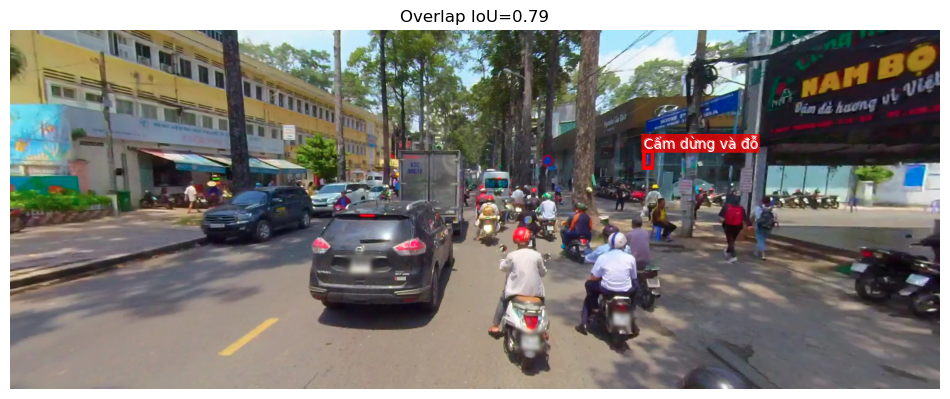

In [8]:
# Visualize an overlap
if overlapping_pairs:
    # Get one example
    img_id_dup, ann1, ann2, iou_val = overlapping_pairs[0]

    print(f"Visualizing Overlap in Image {img_id_dup} (IoU: {iou_val:.2f})")
    print(f"Box 1: {ann1['bbox']}")
    print(f"Box 2: {ann2['bbox']}")

    show_image_with_boxes(img_id_dup, [ann1, ann2], title=f"Overlap IoU={iou_val:.2f}")
else:
    print("No significant overlaps found.")

**Conclusion:**
Overlapping boxes for the same object confuse the model. Suppressing them (keeping the highest confidence or largest area) is necessary.

## 5. Analysis: Class Distribution
Check for class imbalance to see if augmentation is needed.

/var/folders/bf/_843lxxs1q5d_gtmdnwx5hbm0000gn/T/ipykernel_94786/994565542.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_counts, x='Count', y='Category', palette='viridis')


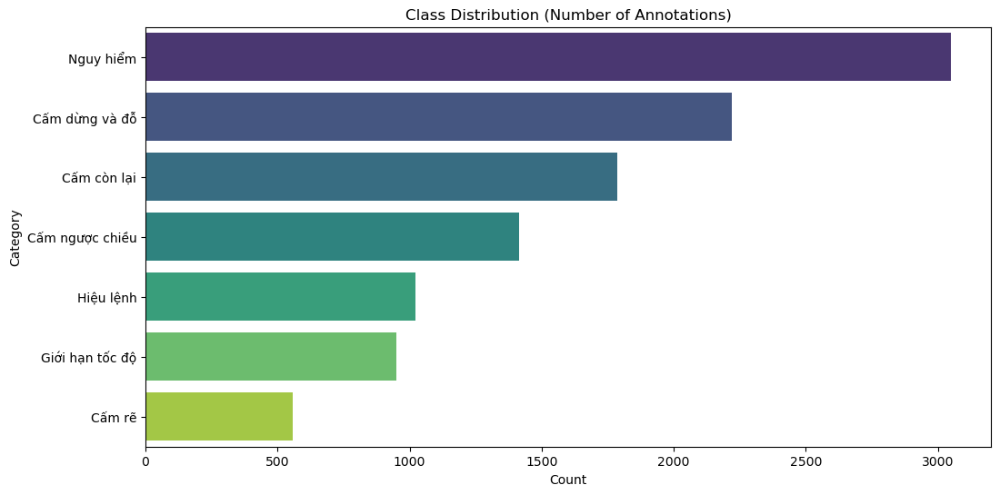

In [9]:
cat_counts = Counter([ann['category_id'] for ann in annotations])
df_counts = pd.DataFrame([
    {'Category': cat_id_to_name[k], 'Count': v}
    for k, v in cat_counts.items()
])
df_counts = df_counts.sort_values('Count', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=df_counts, x='Count', y='Category', palette='viridis')
plt.title("Class Distribution (Number of Annotations)")
plt.show()

In [10]:
# Calculate imbalance stats
max_count = df_counts['Count'].max()
min_count = df_counts['Count'].min()
print(f"Most frequent: {max_count}")
print(f"Least frequent: {min_count}")
print(f"Imbalance Ratio: {max_count / min_count:.2f}")

Most frequent: 3049
Least frequent: 556
Imbalance Ratio: 5.48


**Conclusion:**
If the imbalance ratio is high (e.g., > 3-5x), class-aware augmentation (augmenting rare classes more) is recommended to prevent the model from biasing towards frequent classes.

## 6. Analysis: Image Sizes
Check image dimensions.

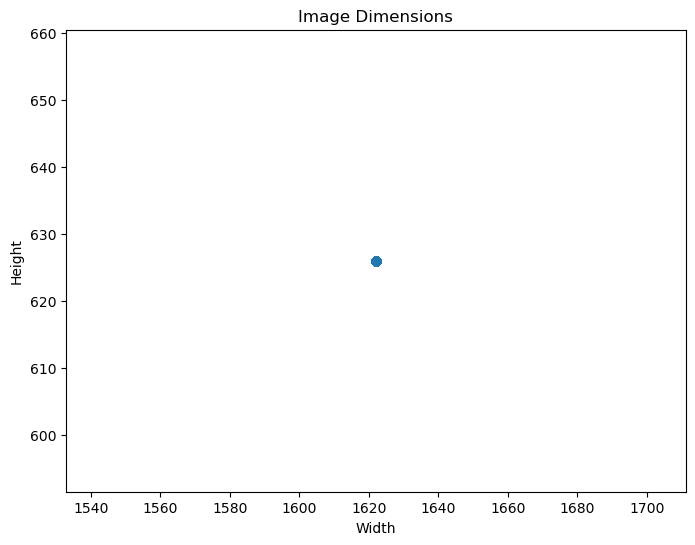

Unique Sizes: {(1622, 626)}


In [11]:
widths = [img['width'] for img in images.values()]
heights = [img['height'] for img in images.values()]

plt.figure(figsize=(8, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.title("Image Dimensions")
plt.xlabel("Width")
plt.ylabel("Height")
plt.show()

print(f"Unique Sizes: {set(zip(widths, heights))}")

## 7. Final Recommendations (Implemented in Preprocessing)

Based on the EDA above, the following steps in `preprocess_clean_augment.py` are justified:

1.  **Small Box Removal**: The analysis showed existence of boxes < 40px^2. These are too small for reliable detection and should be filtered.
2.  **Duplicate Suppression**: High IoU overlaps (> 0.7) for the same class confirm duplicate annotations that need cleaning.
3.  **Class Balancing**: The class distribution plot reveals significant imbalance. The preprocessing script's strategy to augment rare classes to reach 80% of the max class count is a sound strategy to mitigate this.